In [7]:
#installing the required libraries
!pip install visualkeras

# Dataset Loading and Preprocessing

In [9]:
#Loading the dataset and creating a dataframe
import os
import pandas as pd
base_path = os.path.join(os.getcwd(), "lung-and-colon-cancer-histopathological-images", "versions", "1")
lung_path = os.path.join(base_path, "lung_colon_image_set", "lung_image_sets")

class_folders = {
    "Lung_scc": os.path.join(lung_path, "lung_scc"),
    "Lung_n": os.path.join(lung_path, "lung_n"),
    "Lung_aca": os.path.join(lung_path, "lung_aca")
}

file_paths = []
labels = []

for label, (class_name, folder_path) in enumerate(class_folders.items()):
    files = os.listdir(folder_path)
    sampled_files = files[:int(len(files) )]
    for file in sampled_files:
        file_paths.append(os.path.join(folder_path, file))
        labels.append(class_name)

df = pd.DataFrame({
    "file_path": file_paths,
    "label": labels
})

768 768


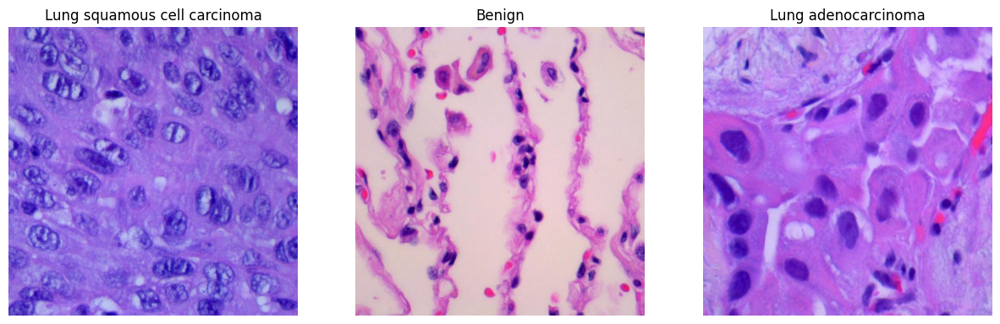

In [10]:
# Data exploration and visualization
from PIL import Image
from matplotlib import pyplot as plt

# Open the image file
image_path = class_folders["Lung_aca"] + "/lungaca1.jpeg"
image = Image.open(image_path)
w, h = image.size 
# Resize the image
new_size = (300, 300)
resized_image = image.resize(new_size)
print(w, h)

# Create a sample of images from each class folder and label them
fig, axes = plt.subplots(1, len(class_folders), figsize=(15, 5))

class_labels = {
    "Lung_scc": "Lung squamous cell carcinoma",
    "Lung_n": "Benign",
    "Lung_aca": "Lung adenocarcinoma"
}

for ax, (class_name, folder_path) in zip(axes, class_folders.items()):
    sample_image_path = os.path.join(folder_path, os.listdir(folder_path)[0])
    sample_image = Image.open(sample_image_path)
    ax.imshow(sample_image)
    ax.set_title(class_labels[class_name])
    ax.axis('off')

plt.show()

In [11]:
df.shape
df.head()

,file_path,label
0,c:\Users\Amirah\OneDrive\005 UM\03_ADVML\Alter...,Lung_scc
1,c:\Users\Amirah\OneDrive\005 UM\03_ADVML\Alter...,Lung_scc
2,c:\Users\Amirah\OneDrive\005 UM\03_ADVML\Alter...,Lung_scc
3,c:\Users\Amirah\OneDrive\005 UM\03_ADVML\Alter...,Lung_scc
4,c:\Users\Amirah\OneDrive\005 UM\03_ADVML\Alter...,Lung_scc


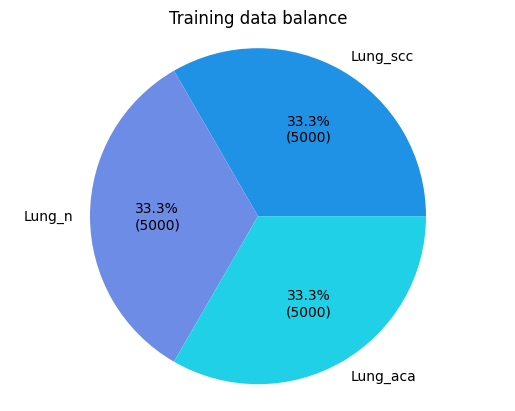

In [12]:
#Find the number of images in each class
data_balance = df.label.value_counts()


def custom_autopct(pct):
    total = sum(data_balance)
    val = int(round(pct*total/100.0))
    return "{:.1f}%\n({:d})".format(pct, val)


# pie chart for data balance
plt.pie(data_balance, labels = data_balance.index, autopct=custom_autopct, colors = ["#2092E6","#6D8CE6","#20D0E6"])
plt.title("Training data balance")
plt.axis("equal")
plt.show()

In [13]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_df, temp_df = train_test_split(df, test_size=0.3, stratify=df['label'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['label'], random_state=42)
gen=ImageDataGenerator()
train_gen=gen.flow_from_dataframe( train_df, x_col='file_path', y_col='label', target_size=(224,224), 
                                   class_mode='categorical',
                                   color_mode='rgb', shuffle=True, batch_size=123)

test_gen=gen.flow_from_dataframe( test_df, x_col='file_path', y_col='label', target_size=(224,224), 
                                  class_mode='categorical',
                                  color_mode='rgb', shuffle=False, batch_size=123)

valid_gen=gen.flow_from_dataframe( val_df, x_col='file_path', y_col='label', target_size=(224,224), 
                                   class_mode='categorical',
                                   color_mode='rgb', shuffle=False, batch_size=123)

classes=list(train_gen.class_indices.keys())
class_count=len(classes)

print ( f"Training set: {len(train_gen.filenames)}")
print ( f"Validation set: {len(valid_gen.filenames)}")
print ( f"Test set: {len(test_gen.filenames)}")

Found 10500 validated image filenames belonging to 3 classes.
Found 2250 validated image filenames belonging to 3 classes.
Found 2250 validated image filenames belonging to 3 classes.
Training set: 10500
Validation set: 2250
Test set: 2250


# Part 1 BaseLine model - ResNet50

In [15]:
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from IPython.display import Image
import os
IMAGE_SIZE = [224, 224] 
resnet = ResNet50(input_shape=IMAGE_SIZE + [3], # 3 for RGB channels 
                  weights='imagenet', # Use the weights of the pre-trained model
                   include_top=False) # include_top=False to remove the output layer
#DO not train existing weights
for layer in resnet.layers: 
    layer.trainable = False # False to freeze the weights

flatten = Flatten()(resnet.output)
dense = Dense(256, activation = 'relu')(flatten)
dense = Dense(128, activation = 'relu')(dense)
prediction = Dense(3, activation = 'softmax')(dense)

#creating a model
model = Model(inputs = resnet.input, outputs = prediction )

model.summary()
#how to make the model.summary into image
# Save the model architecture as an image file
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)

# Ensure the file is saved in the current working directory
current_dir = os.getcwd()
image_path = os.path.join(current_dir, 'model_architecture.png')

# Display the image
display(Image(filename=image_path))

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 49,311,363 (188.11 MB)

 Trainable params: 25,723,651 (98.13 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [166]:
# Save the model architecture as an image file
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)

# Ensure the file is saved in the current working directory
current_dir = os.getcwd()
image_path = os.path.join(current_dir, 'model_architecture.png')

# Display the image
display(Image(filename=image_path))


In [167]:
#Training the model with train dataset
model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])
history = model.fit(train_gen, validation_data=valid_gen, epochs=5, verbose=1)

c:\Users\Amirah\anaconda3\envs\farmbyte\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
86/86 ━━━━━━━━━━━━━━━━━━━━ 441s 5s/step - accuracy: 0.7822 - loss: 7.2542 - val_accuracy: 0.9573 - val_loss: 0.2087
Epoch 2/5
86/86 ━━━━━━━━━━━━━━━━━━━━ 387s 5s/step - accuracy: 0.9813 - loss: 0.0677 - val_accuracy: 0.9907 - val_loss: 0.0274
Epoch 3/5
86/86 ━━━━━━━━━━━━━━━━━━━━ 387s 5s/step - accuracy: 0.9982 - loss: 0.0055 - val_accuracy: 0.9818 - val_loss: 0.0748
Epoch 4/5
86/86 ━━━━━━━━━━━━━━━━━━━━ 389s 5s/step - accuracy: 0.9976 - loss: 0.0063 - val_accuracy: 0.9907 - val_loss: 0.0367
Epoch 5/5
86/86 ━━━━━━━━━━━━━━━━━━━━ 385s 4s/step - accuracy: 1.0000 - loss: 6.6816e-04 - val_accuracy: 0.9916 - val_loss: 0.0338


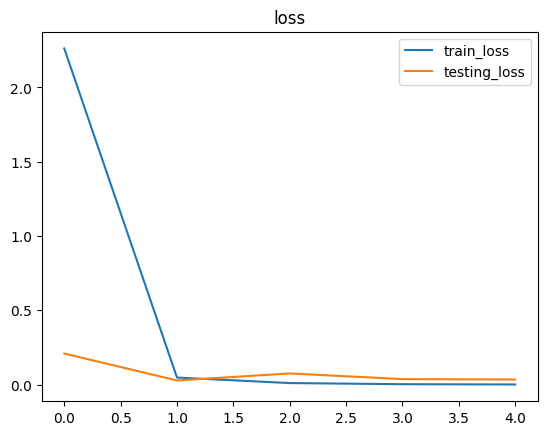

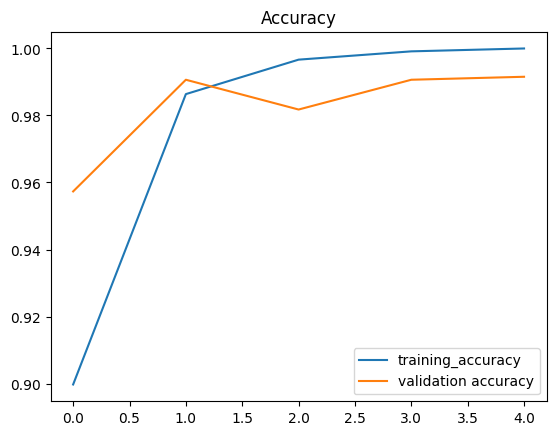

In [168]:
# plotting the loss
plt.plot(history.history['loss'],label = 'train_loss')
plt.plot(history.history['val_loss'], label = 'testing_loss')
plt.title('loss')
plt.legend()
plt.show()

# Both Validation and Training accuracy is shown here

plt.plot(history.history['accuracy'], label='training_accuracy')
plt.plot(history.history['val_accuracy'], label='validation accuracy')
plt.title('Accuracy')
plt.legend()
plt.show()

19/19 ━━━━━━━━━━━━━━━━━━━━ 71s 4s/step
Confusion Matrix


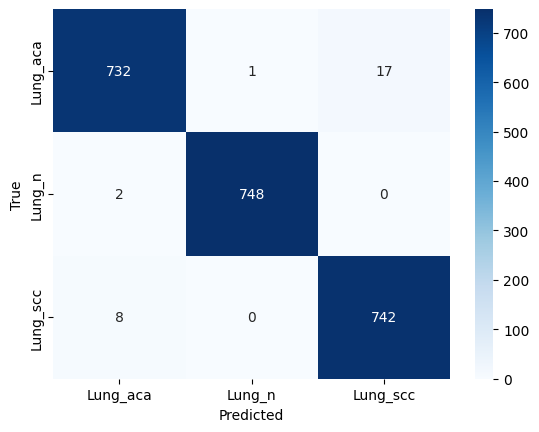

Classification Report
              precision    recall  f1-score   support

         aca       0.99      0.98      0.98       750
           n       1.00      1.00      1.00       750
         scc       0.98      0.99      0.98       750

    accuracy                           0.99      2250
   macro avg       0.99      0.99      0.99      2250
weighted avg       0.99      0.99      0.99      2250



In [169]:
from sklearn.metrics import classification_report, confusion_matrix, f1_score
import seaborn as sns
import numpy as np

Y_pred = model.predict(test_gen)
y_pred = np.argmax(Y_pred, axis=1)

print('Confusion Matrix')
confusion_matrix = confusion_matrix(test_gen.classes, y_pred)

sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

print('Classification Report')
target_names = ['aca', 'n', 'scc']
print(classification_report(test_gen.classes, y_pred, target_names=target_names))

In [171]:
#calculate how many true positive, true negative, false positive, false negative
TP = confusion_matrix[0,0]
TN = confusion_matrix[1,1] + confusion_matrix[1,2] + confusion_matrix[2,1] + confusion_matrix[2,2]
FP = confusion_matrix[1,0] + confusion_matrix[2,0]
FN = confusion_matrix[0,1] + confusion_matrix[0,2]
print("True Positive: ", TP)
print("True Negative: ", TN)
print("False Positive: ", FP)
print("False Negative: ", FN)

#calculate actual recall and precision and f1 score
recall = TP / (TP + FN)
precision = TP / (TP + FP)
f1 = 2 * precision * recall / (precision + recall)
print("Recall: ", recall)
print("Precision: ", precision)
print("F1 Score: ", f1)

True Positive:  732
True Negative:  1490
False Positive:  10
False Negative:  18
Recall:  0.976
Precision:  0.9865229110512129
F1 Score:  0.9812332439678283


# Part 2 Ultralytics Model YOLO v11

In [141]:
import shutil
import os 
import pandas as pd
from sklearn.model_selection import train_test_split
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset

#create a directory for the yolo dataset
yolo_dir = os.path.join(os.getcwd(), "lung_cancer_dataset")

# Loop through the train, val, test dataframes and copy the images to the respective folders
for dataset, folder_name in [(train_df, 'train'), (val_df, 'val'), (test_df, 'test')]:
    # Create folder structure for each dataset
    for class_name in class_folders.keys():
        class_dir = os.path.join(yolo_dir, folder_name, class_name)
        os.makedirs(class_dir, exist_ok=True)
    
    # Copy files to appropriate folders
    for _, row in dataset.iterrows():
        source_path = row['file_path']
        class_name = row['label']
        destination_dir = os.path.join(yolo_dir, folder_name, class_name)
        shutil.copy(source_path, destination_dir)


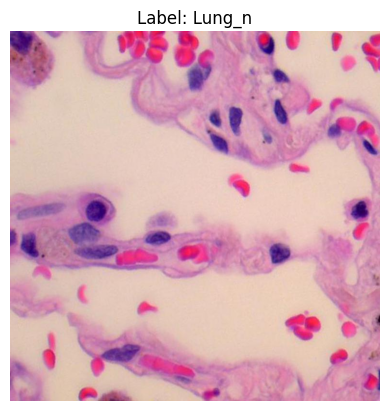

In [157]:
#show the image from train_dataset
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# Get a random row from train_df
rand_idx = np.random.randint(len(train_df))
random_row = train_df.iloc[rand_idx]

# Load and display the image
image_path = random_row['file_path']
label = random_row['label']
image = Image.open(image_path)

# Convert PIL image to numpy array
image = np.array(image)

# Display the image
plt.imshow(image)
plt.title(f'Label: {label}')
plt.axis('off')
plt.show()



In [158]:
#load the train_df, val_df and test_df images from the yolo folder
import os
import pandas as pd
import shutil
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11x-cls.pt")  # load a pretrained model (recommended for training)

#check if yolo using gpu or cpu 
import torch
torch.cuda.is_available()

# Train the model
results = model.train(data=yolo_dir, epochs=10, imgsz=224, device='gpu', plots=True )


New https://pypi.org/project/ultralytics/8.3.55 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.54  Python-3.10.15 torch-2.3.0 CUDA:gpu (NVIDIA GeForce RTX 4070 SUPER, 12282MiB)
engine\trainer: task=classify, mode=train, model=yolo11x-cls.pt, data=C:\Users\Amirah\OneDrive\005 UM\03_ADVML\Alternative_asgnmt\lung_cancer_dataset, epochs=10, time=None, patience=100, batch=16, imgsz=224, save=True, save_period=-1, cache=False, device=gpu, workers=8, project=None, name=train6, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=Fal

train: Scanning C:\Users\Amirah\OneDrive\005 UM\03_ADVML\Alternative_asgnmt\lung_cancer_dataset\train... 10500 images, 0 corrupt: 100%|██████████| 10500/10500 [00:06<00:00, 1735.59it/s]


train: New cache created: C:\Users\Amirah\OneDrive\005 UM\03_ADVML\Alternative_asgnmt\lung_cancer_dataset\train.cache


val: Scanning C:\Users\Amirah\OneDrive\005 UM\03_ADVML\Alternative_asgnmt\lung_cancer_dataset\val... 2250 images, 0 corrupt: 100%|██████████| 2250/2250 [00:01<00:00, 1298.59it/s]

val: New cache created: C:\Users\Amirah\OneDrive\005 UM\03_ADVML\Alternative_asgnmt\lung_cancer_dataset\val.cache


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 82 weight(decay=0.0), 83 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 224 train, 224 val
Using 8 dataloader workers
Logging results to runs\classify\train6
Starting training for 10 epochs...

      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 71/71 [00:04<00:00, 17.37it/s]

                   all      0.968          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 71/71 [00:03<00:00, 20.11it/s]

                   all      0.963          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 71/71 [00:03<00:00, 19.50it/s]

                   all      0.983          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 71/71 [00:04<00:00, 16.63it/s]


                   all      0.968          1

      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 71/71 [00:03<00:00, 20.52it/s]


                   all      0.986          1

      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 71/71 [00:03<00:00, 20.57it/s]

                   all      0.977          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 71/71 [00:03<00:00, 18.54it/s]

                   all          1          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 71/71 [00:03<00:00, 18.10it/s]

                   all      0.997          1



      Epoch    GPU_mem       loss  Instances       Size


               classes   top1_acc   top5_acc: 100%|██████████| 71/71 [00:03<00:00, 18.79it/s]

                   all      0.999          1



      Epoch    GPU_mem       loss  Instances       Size


      10/10      2.05G    0.02136          4        224: 100%|██████████| 657/657 [00:58<00:00, 11.20it/s]
               classes   top1_acc   top5_acc: 100%|██████████| 71/71 [00:03<00:00, 19.34it/s]

                   all      0.998          1



10 epochs completed in 0.211 hours.
Optimizer stripped from runs\classify\train6\weights\last.pt, 57.0MB
Optimizer stripped from runs\classify\train6\weights\best.pt, 57.0MB

Validating runs\classify\train6\weights\best.pt...
Ultralytics 8.3.54  Python-3.10.15 torch-2.3.0 CUDA:gpu (NVIDIA GeForce RTX 4070 SUPER, 12282MiB)
YOLO11x-cls summary (fused): 227 layers, 28,336,259 parameters, 0 gradients, 110.3 GFLOPs
train: C:\Users\Amirah\OneDrive\005 UM\03_ADVML\Alternative_asgnmt\lung_cancer_dataset\train... found 10500 images in 3 classes  
val: C:\Users\Amirah\OneDrive\005 UM\03_ADVML\Alternative_asgnmt\lung_cancer_dataset\val... found 2250 images in 3 classes  
test: C:\Users\Amirah\OneDrive\005 UM\03_ADVML\Alternative_asgnmt\lung_cancer_dataset\test... found 2250 images in 3 classes  


               classes   top1_acc   top5_acc: 100%|██████████| 71/71 [00:04<00:00, 17.32it/s]


                   all          1          1
Speed: 0.1ms preprocess, 0.7ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to runs\classify\train6



image 1/1 C:\Users\Amirah\OneDrive\005 UM\03_ADVML\Alternative_asgnmt\lung_cancer_dataset\test\Lung_aca\lungaca100.jpeg: 224x224 Lung_aca 1.00, Lung_scc 0.00, Lung_n 0.00, 129.2ms
Speed: 6.1ms preprocess, 129.2ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)

image 1/1 C:\Users\Amirah\OneDrive\005 UM\03_ADVML\Alternative_asgnmt\lung_cancer_dataset\test\Lung_aca\lungaca1001.jpeg: 224x224 Lung_aca 1.00, Lung_n 0.00, Lung_scc 0.00, 44.1ms
Speed: 5.5ms preprocess, 44.1ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)

image 1/1 C:\Users\Amirah\OneDrive\005 UM\03_ADVML\Alternative_asgnmt\lung_cancer_dataset\test\Lung_aca\lungaca1006.jpeg: 224x224 Lung_aca 1.00, Lung_scc 0.00, Lung_n 0.00, 42.7ms
Speed: 5.5ms preprocess, 42.7ms inference, 0.0ms postprocess per image at shape (1, 3, 224, 224)

image 1/1 C:\Users\Amirah\OneDrive\005 UM\03_ADVML\Alternative_asgnmt\lung_cancer_dataset\test\Lung_aca\lungaca1007.jpeg: 224x224 Lung_aca 1.00, Lung_scc 0.00, Lung

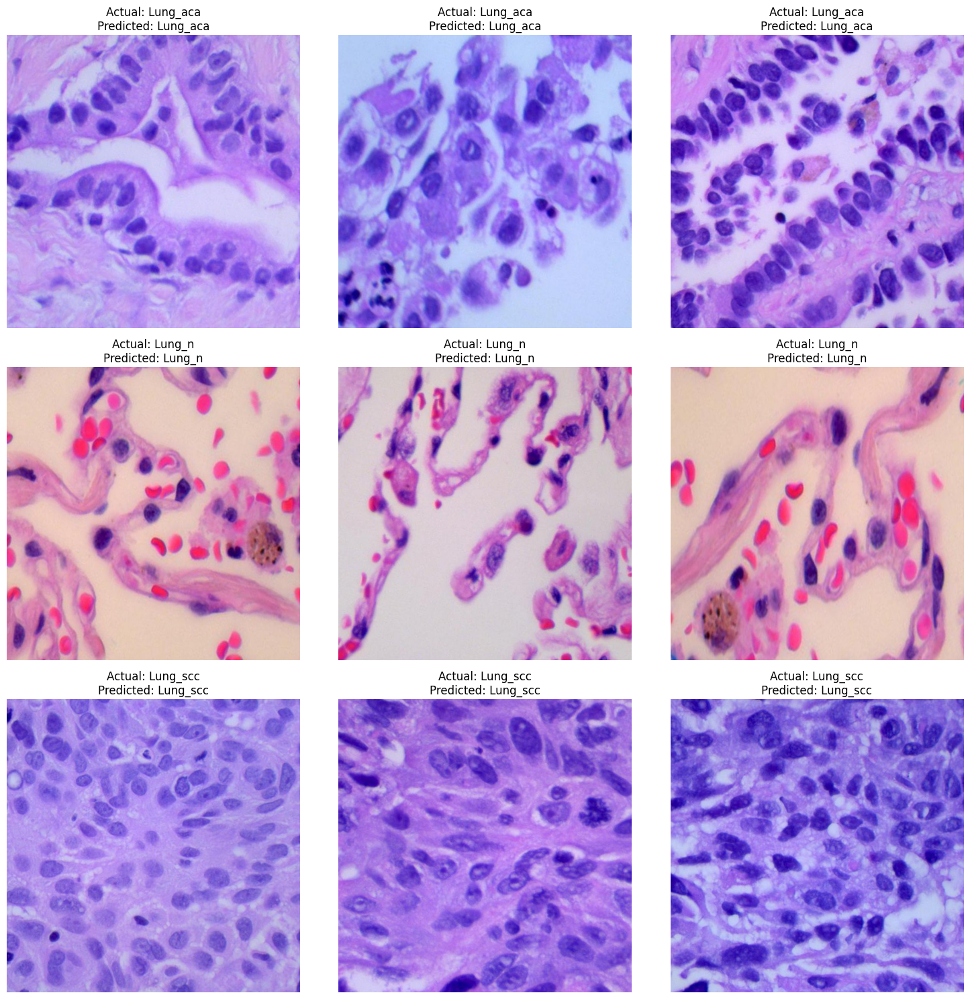

              precision    recall  f1-score   support

    Lung_aca       0.99      1.00      1.00       750
      Lung_n       1.00      1.00      1.00       750
    Lung_scc       1.00      0.99      1.00       750

    accuracy                           1.00      2250
   macro avg       1.00      1.00      1.00      2250
weighted avg       1.00      1.00      1.00      2250

[[748   0   2]
 [  0 750   0]
 [  5   0 745]]


In [ ]:
#Predict the images from the test dataset and display the actual and predicted class labels
import numpy as np
actual = [] #list to add actual class labels
predicted = [] #list to add predicted class
from sklearn.metrics import classification_report, confusion_matrix

dir_main = os.path.join(yolo_dir,'test')
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
sample_count = {class_name: 0 for class_name in os.listdir(dir_main)}
max_samples_per_class = 3

# Flatten axes for easier indexing
axes_flat = axes.flatten()
plot_idx = 0

for path in os.listdir(dir_main):
    dir = os.path.join(dir_main,path)
    for images in os.listdir(dir):
        img_path = os.path.join(dir,images)
        results = model.predict(img_path)[0]
        
        actual.append(path)  # actual class label is the folder name
        
        idx_max = np.argmax(results.probs.data.cpu().numpy())   # predicted class label is the class with maximum probability
        
        if idx_max == 0:
            predicted.append('Lung_aca')
        elif idx_max == 1:
            predicted.append('Lung_n')
        else:
            predicted.append('Lung_scc')
        
        # Display only 3 samples per class (9 images total)
        if sample_count[path] < max_samples_per_class:
            img = plt.imread(img_path)
            axes_flat[plot_idx].imshow(img)
            axes_flat[plot_idx].set_title(f'Actual: {path}\nPredicted: {predicted[-1]}')
            axes_flat[plot_idx].axis('off')
            plot_idx += 1
            sample_count[path] += 1

plt.tight_layout()
plt.show()

print(classification_report(actual, predicted))
print(confusion_matrix(actual, predicted))

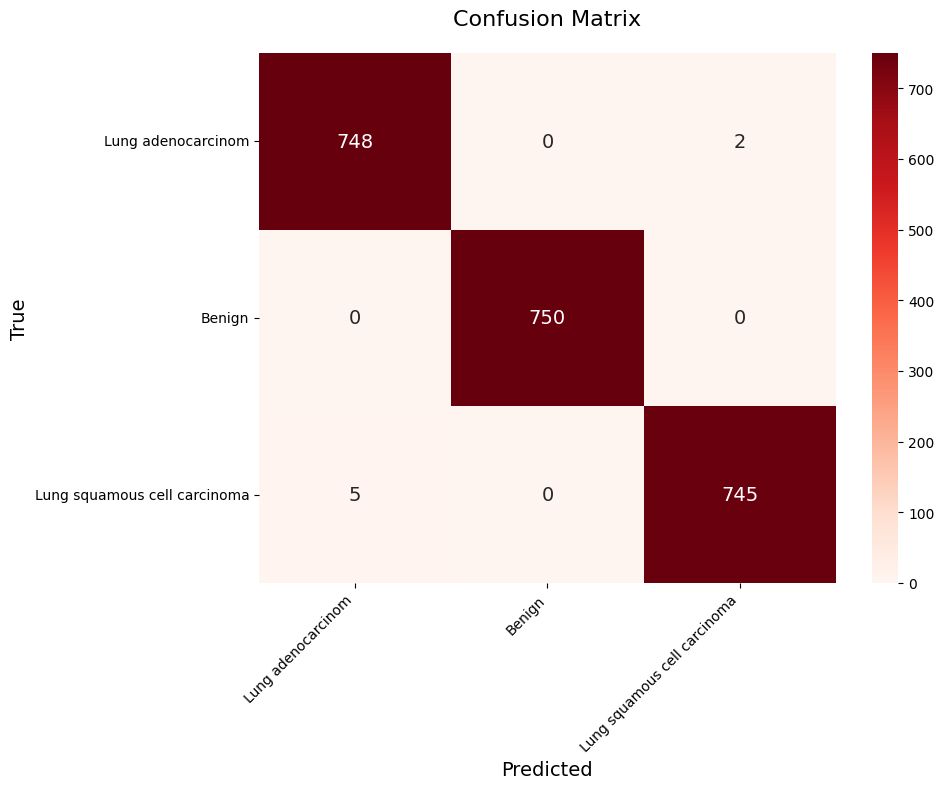

In [109]:
#plot the confusion matrix
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Create figure with larger size
plt.figure(figsize=(10, 8))

# Define class labels
class_labels = ["Lung adenocarcinom", "Benign", "Lung squamous cell carcinoma"]

# Create confusion matrix
cm = confusion_matrix(actual, predicted)

# Create heatmap with customized parameters
sns.heatmap(cm, annot=True, fmt='d', cmap='Reds', 
			xticklabels=class_labels, 
			yticklabels=class_labels,
			annot_kws={'size': 14})

# Add labels and title
plt.xlabel('Predicted', fontsize=14)
plt.ylabel('True', fontsize=14)
plt.title('Confusion Matrix', fontsize=16, pad=20)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Show the plot
plt.show()


In [111]:
#calculate the true positive, true negative, false positive, false negative
TP = cm[0,0]
TN = cm[1,1] + cm[1,2] + cm[2,1] + cm[2,2]
FP = cm[1,0] + cm[2,0]
FN = cm[0,1] + cm[0,2]
print("True Positive: ", TP)
print("True Negative: ", TN)
print("False Positive: ", FP)
print("False Negative: ", FN)

#calculate actual recall and precision and f1 score
recall = TP / (TP + FN)
precision = TP / (TP + FP)
f1 = 2 * precision * recall / (precision + recall)
print("Recall: ", recall)
print("Precision: ", precision)
print("F1 Score: ", f1)


True Positive:  748
True Negative:  1495
False Positive:  5
False Negative:  2
Recall:  0.9973333333333333
Precision:  0.9933598937583001
F1 Score:  0.9953426480372588


In [47]:
results_dict = metrics.results_dict
print(results_dict)

{'metrics/accuracy_top1': 0.9911110997200012, 'metrics/accuracy_top5': 1.0, 'fitness': 0.9955555498600006}


For image classification tasks specifically, compare models using the reported top-1 and top-5 accuracies for classification tasks. These metrics reflect how often the actual label matches the highest predicted label (top-1) or is among the top 5 predicted labels (top-5), which are standard measures of accuracy in classification models.

# Part 3 MobileNet 

In [19]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model


base_model = MobileNetV2(input_shape=(224, 224, 3), weights='imagenet', include_top=False)


for layer in base_model.layers:
    layer.trainable = False


x = Flatten()(base_model.output)
x = Dense(256, activation='relu')(x)
x = Dense(128, activation='relu')(x)
output = Dense(3, activation='softmax')(x)  # Adjust the output layer based on the number of classes


model = Model(inputs=base_model.input, outputs=output)
model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 18,347,843 (69.99 MB)

 Trainable params: 16,089,859 (61.38 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [20]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [21]:
history = model.fit(
    train_gen,
    validation_data=valid_gen,
    epochs=5,
    verbose=1
)


c:\Users\Amirah\anaconda3\envs\farmbyte\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
86/86 ━━━━━━━━━━━━━━━━━━━━ 134s 2s/step - accuracy: 0.7280 - loss: 6.1610 - val_accuracy: 0.9244 - val_loss: 0.2392
Epoch 2/5
86/86 ━━━━━━━━━━━━━━━━━━━━ 169s 2s/step - accuracy: 0.9315 - loss: 0.2118 - val_accuracy: 0.9009 - val_loss: 0.5464
Epoch 3/5
86/86 ━━━━━━━━━━━━━━━━━━━━ 163s 2s/step - accuracy: 0.9297 - loss: 0.2858 - val_accuracy: 0.9338 - val_loss: 0.2686
Epoch 4/5
86/86 ━━━━━━━━━━━━━━━━━━━━ 162s 2s/step - accuracy: 0.9566 - loss: 0.1174 - val_accuracy: 0.9156 - val_loss: 0.2502
Epoch 5/5
86/86 ━━━━━━━━━━━━━━━━━━━━ 160s 2s/step - accuracy: 0.9711 - loss: 0.0668 - val_accuracy: 0.9476 - val_loss: 0.1429


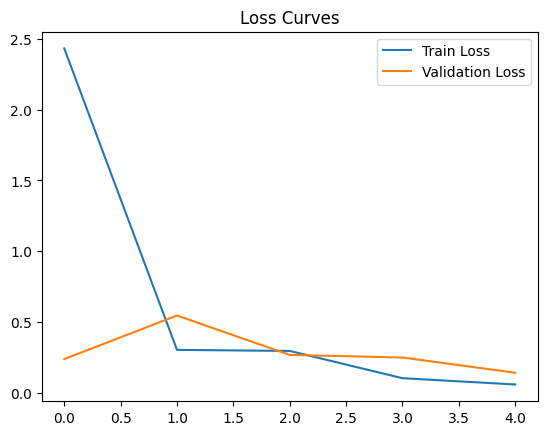

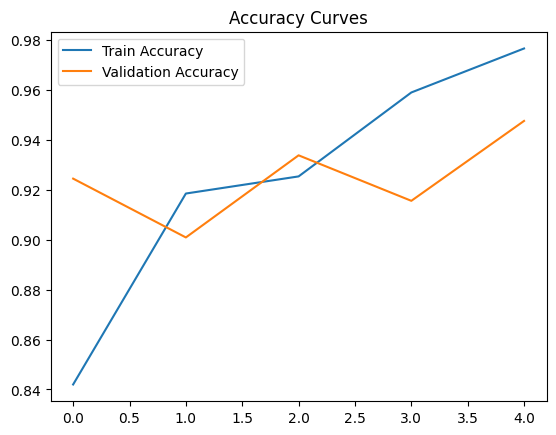

In [22]:
import matplotlib.pyplot as plt


plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Curves')
plt.legend()
plt.show()


plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy Curves')
plt.legend()
plt.show()


19/19 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step


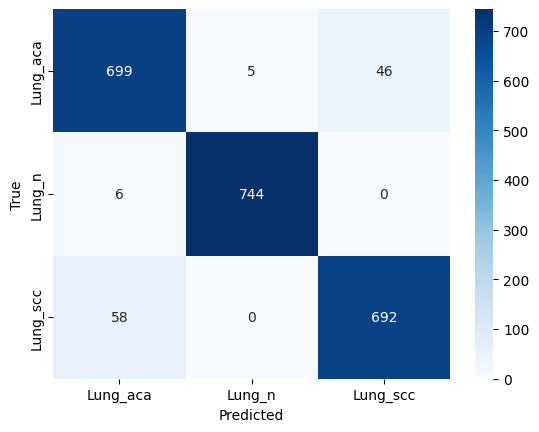

Classification Report:
              precision    recall  f1-score   support

    Lung_aca       0.92      0.93      0.92       750
      Lung_n       0.99      0.99      0.99       750
    Lung_scc       0.94      0.92      0.93       750

    accuracy                           0.95      2250
   macro avg       0.95      0.95      0.95      2250
weighted avg       0.95      0.95      0.95      2250



In [23]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import numpy as np


Y_pred = model.predict(test_gen)
y_pred = np.argmax(Y_pred, axis=1)


cm = confusion_matrix(test_gen.classes, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=test_gen.class_indices.keys(), yticklabels=test_gen.class_indices.keys())
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()


print("Classification Report:")
print(classification_report(test_gen.classes, y_pred, target_names=test_gen.class_indices.keys()))


# Part 4 - InceptionV3

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 111, 111,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 111, 111,  │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 111, 111,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 109, 109,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 109, 109,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 109, 109,  │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 109, 109,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 54, 54,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 54, 54,    │      5,120 │ max_pooling2d[0]… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 54, 54,    │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 54, 54,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 52, 52,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 52, 52,    │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 52, 52,    │          0 │ batch_normalizat

 Total params: 34,943,523 (133.30 MB)

 Trainable params: 13,140,739 (50.13 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

c:\Users\Amirah\anaconda3\envs\farmbyte\lib\site-packages\visualkeras\layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")
c:\Users\Amirah\anaconda3\envs\farmbyte\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
86/86 ━━━━━━━━━━━━━━━━━━━━ 194s 2s/step - accuracy: 0.5500 - loss: 201.6265 - val_accuracy: 0.8484 - val_loss: 2.8393
Epoch 2/5
86/86 ━━━━━━━━━━━━━━━━━━━━ 126s 1s/step - accuracy: 0.8204 - loss: 4.0909 - val_accuracy: 0.8111 - val_loss: 3.8673
Epoch 3/5
86/86 ━━━━━━━━━━━━━━━━━━━━ 126s 1s/step - accuracy: 0.8006 - loss: 5.5646 - val_accuracy: 0.8831 - val_loss: 1.8948
Epoch 4/5
86/86 ━━━━━━━━━━━━━━━━━━━━ 127s 1s/step - accuracy: 0.8766 - loss: 1.8819 - val_accuracy: 0.8827 - val_loss: 1.5276
Epoch 5/5
86/86 ━━━━━━━━━━━━━━━━━━━━ 127s 1s/step - accuracy: 0.8654 - loss: 2.4738 - val_accuracy: 0.8831 - val_loss: 2.5364


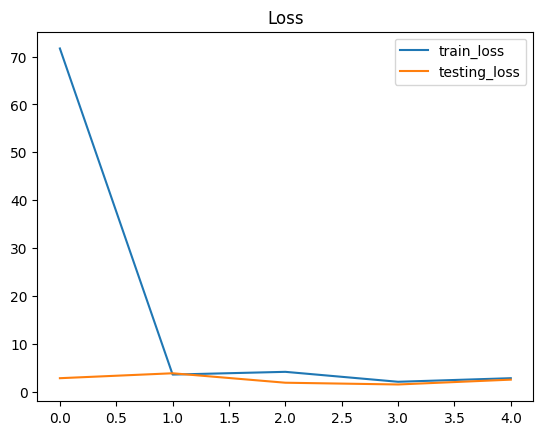

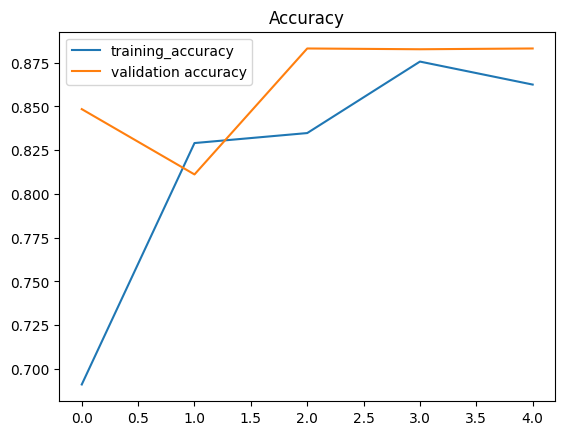

19/19 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step
Confusion Matrix


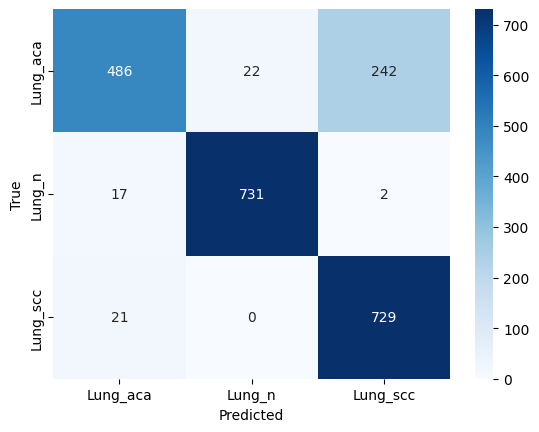

Classification Report
              precision    recall  f1-score   support

         aca       0.93      0.65      0.76       750
           n       0.97      0.97      0.97       750
         scc       0.75      0.97      0.85       750

    accuracy                           0.86      2250
   macro avg       0.88      0.86      0.86      2250
weighted avg       0.88      0.86      0.86      2250

True Positive:  486
True Negative:  1462
False Positive:  38
False Negative:  264
Recall:  0.648
Precision:  0.9274809160305344
F1 Score:  0.7629513343799059


In [14]:

from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.layers import Input, Flatten, Dense
from tensorflow.keras.models import Model
# Replacing plot_model with visualkeras
import visualkeras
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import numpy as np
from IPython.display import Image as IPImage


# Model Definition
IMAGE_SIZE = [224, 224]
inception = InceptionV3(input_shape=IMAGE_SIZE + [3], weights='imagenet', include_top=False)

for layer in inception.layers:
    layer.trainable = False

x = Flatten()(inception.output)
# Match exactly ResNet50's architecture
x = Dense(256, activation='relu')(x)
x = Dense(128, activation='relu')(x)
prediction = Dense(3, activation='softmax')(x)

model = Model(inputs=inception.input, outputs=prediction)
model.summary()

# Save model architecture visualization
visualkeras.layered_view(model, to_file='model_architecture.png', legend=True).show() 

# Model Training
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
history = model.fit(train_gen, validation_data=valid_gen, epochs=5, verbose=1)

# Training visualization
plt.plot(history.history['loss'], label='train_loss')
plt.plot(history.history['val_loss'], label='testing_loss')
plt.title('Loss')
plt.legend()
plt.show()

plt.plot(history.history['accuracy'], label='training_accuracy')
plt.plot(history.history['val_accuracy'], label='validation accuracy')
plt.title('Accuracy')
plt.legend()
plt.show()

# Evaluation
Y_pred = model.predict(test_gen)
y_pred = np.argmax(Y_pred, axis=1)

print('Confusion Matrix')
confusion_matrix = confusion_matrix(test_gen.classes, y_pred)

sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

print('Classification Report')
target_names = ['aca', 'n', 'scc']
print(classification_report(test_gen.classes, y_pred, target_names=target_names))

# Calculate metrics
TP = confusion_matrix[0,0]
TN = confusion_matrix[1,1] + confusion_matrix[1,2] + confusion_matrix[2,1] + confusion_matrix[2,2]
FP = confusion_matrix[1,0] + confusion_matrix[2,0]
FN = confusion_matrix[0,1] + confusion_matrix[0,2]

print("True Positive: ", TP)
print("True Negative: ", TN)
print("False Positive: ", FP)
print("False Negative: ", FN)

recall = TP / (TP + FN)
precision = TP / (TP + FP)
f1 = 2 * precision * recall / (precision + recall)
print("Recall: ", recall)
print("Precision: ", precision)
print("F1 Score: ", f1)